In [1]:
!pip install scFates

In [2]:
import sys
!{sys.executable} -m pip -q install palantir fa2

In [3]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [68]:
sc.pp.filter_genes(adata1,min_cells=3)
sc.pp.normalize_total(adata1)
sc.pp.log1p(adata1,base=10)
sc.pp.highly_variable_genes(adata1)

ValueError: Bin edges must be unique: array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan]).
You can drop duplicate edges by setting the 'duplicates' kwarg

In [145]:

sc.pp.pca(adatamergedsubset)
pca_projections = pd.DataFrame(adatamergedsubset.obsm["X_pca"],index=adatamergedsubset.obs_names)

computing PCA
    with n_comps=50
    finished (0:00:02)


In [261]:
pca_projections = pd.DataFrame(adatamerged.obsm["X_pca"],index=adatamerged.obs_names)

In [284]:
pca_projections

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
AAACCTGTCATCGCTC-1_1-0,1.59,-0.69,0.72,-6.00,-2.86,-1.03,-2.03,2.05,-3.72,3.18,...,-0.32,2.71,1.80,0.44,3.87,5.26e-01,-0.32,2.86e+00,0.43,-1.93
AAACCTGTCGCGCCAA-1_1-0,0.48,-8.32,8.50,-6.48,7.88,-1.75,0.07,-0.81,-6.22,-1.22,...,-0.43,0.27,-0.50,-1.66,-0.71,-2.47e+00,-0.24,3.11e-01,2.06,-0.46
AAACGGGTCAGGATCT-1_1-0,-2.57,1.89,-1.03,1.39,-0.07,-3.40,0.86,0.35,-0.19,-1.00,...,-1.05,-1.47,-2.62,2.54,0.63,-4.69e-01,0.78,3.11e-03,-5.01,1.14
AAAGATGCATAGACTC-1_1-0,-3.82,2.26,-2.36,0.13,-1.08,-2.96,-0.53,1.31,-1.36,0.88,...,-0.76,-0.43,0.85,1.08,-1.94,-2.91e-01,0.40,1.20e+00,0.18,-2.06
AAAGCAACATCTACGA-1_1-0,-2.91,2.81,-2.26,0.85,-0.74,-2.51,0.29,1.40,-1.36,-0.41,...,-1.91,0.26,0.14,-0.16,1.23,5.86e-03,-0.50,-7.38e-01,-0.04,-0.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2-2,3.80,1.13,-1.45,-6.99,-4.36,-0.66,-1.76,2.51,-1.82,1.59,...,-0.36,-1.46,-1.20,-0.61,-0.66,-1.06e-01,-0.45,-1.99e+00,-0.43,0.56
TTTGCGCGTCTCTCGT-1_2-2,17.38,0.11,0.37,-13.89,-10.55,0.28,-0.77,-0.53,2.51,5.48,...,-1.79,-2.20,0.15,0.71,-0.56,2.07e+00,2.21,-4.98e-01,0.84,-1.37
TTTGCGCTCAACCAAC-1_2-2,-3.81,1.22,-1.93,2.27,-0.19,-3.60,0.11,-1.21,0.62,0.06,...,2.29,-0.02,-0.41,0.83,0.19,2.59e-02,0.03,-6.49e-01,0.26,1.08
TTTGGTTGTAAGAGAG-1_2-2,-3.96,1.02,-1.12,2.16,0.07,-1.05,1.14,-5.93,4.81,1.64,...,-0.26,-0.66,0.80,-1.04,-0.13,7.29e-01,0.90,1.48e-02,-1.47,-1.54


In [146]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [147]:
# generate neighbor draph in multiscale diffusion space
adatamergedsubset.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adatamergedsubset,n_neighbors=30,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [148]:
# draw ForceAtlas2 embedding using 3 first PCs as initial positions
adatamergedsubset.obsm["X_pca2d"]=adatamergedsubset.obsm["X_pca"][:,:3]
sc.tl.draw_graph(adatamergedsubset, layout = 'fa',init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:23)


In [334]:
adatamerged.obsm["X_fates"]

array([[ 2.75946767e+04, -5.25716488e+03,  7.22433090e-01],
       [ 1.59713120e+04, -2.21592431e+04,  8.50496197e+00],
       [-2.54859694e+03,  3.65038127e+03, -1.02886629e+00],
       ...,
       [-1.62379917e+04,  2.72618415e+03, -1.92596996e+00],
       [-1.72461658e+03, -1.12489741e+04, -1.11996961e+00],
       [-6.87011497e+03,  5.58902266e+03, -2.05057096e+00]])

In [318]:
adatamerged.obsm["X_fates"]=np.concatenate([adatamerged.obsm["X_draw_graph_fa"], adatamerged.obsm["X_pca"][:,2:3]], axis=1)

In [351]:
adataWT.obsm["X_fates"]=np.concatenate([adataWT.obsm["X_draw_graph_fa"], adataWT.obs["velocity_pseudotime"].values.reshape(-1,1)], axis=1)

In [350]:
adataWT.obs["velocity_pseudotime"]

AAACCCAAGAGGACTC    1.00
AAACGCTTCCTCTGCA    0.75
AAAGGATGTGAGTCAG    0.62
AAAGGTAAGGCACCAA    0.67
AAAGTCCAGCATCCCG    0.68
                    ... 
TTTGGAGCATCTGGGC    0.22
TTTGGTTCACTGGAAG    0.59
TTTGGTTTCGGATACT    0.77
TTTGGTTTCTCCAAGA    0.81
TTTGGTTTCTTAAGGC    0.82
Name: velocity_pseudotime, Length: 2016, dtype: float64

In [325]:
adatamerged.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels,labels1,batch
AAACCTGTCATCGCTC-1_1-0,2,11665.0,2368,Normal,1.29,2,2,2,NaN,macrophage_1,0
AAACCTGTCGCGCCAA-1_1-0,9,28251.0,4833,Normal,1.72,9,9,9,NaN,monocyte,0
AAACGGGTCAGGATCT-1_1-0,0,6698.0,2007,Normal,2.45,0,0,0,NaN,microglia_1,0
AAAGATGCATAGACTC-1_1-0,0,9251.0,2057,Normal,4.35,0,0,0,NaN,microglia_1,0
AAAGCAACATCTACGA-1_1-0,0,14500.0,2956,Normal,3.50,0,0,0,NaN,microglia_1,0
...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2-2,2,11350.0,2844,OIR_WT,2.37,2,2,2,1,macrophage_1,2
TTTGCGCGTCTCTCGT-1_2-2,2,10238.0,2791,OIR_WT,2.10,2,2,2,1,macrophage_1,2
TTTGCGCTCAACCAAC-1_2-2,1,9996.0,2645,OIR_WT,5.47,1,1,1,0,microglia_1,2
TTTGGTTGTAAGAGAG-1_2-2,5,6111.0,1857,OIR_WT,4.52,5,5,5,3,microglia_2,2


In [211]:
sc.tl.umap(adatamerged,n_components=3)

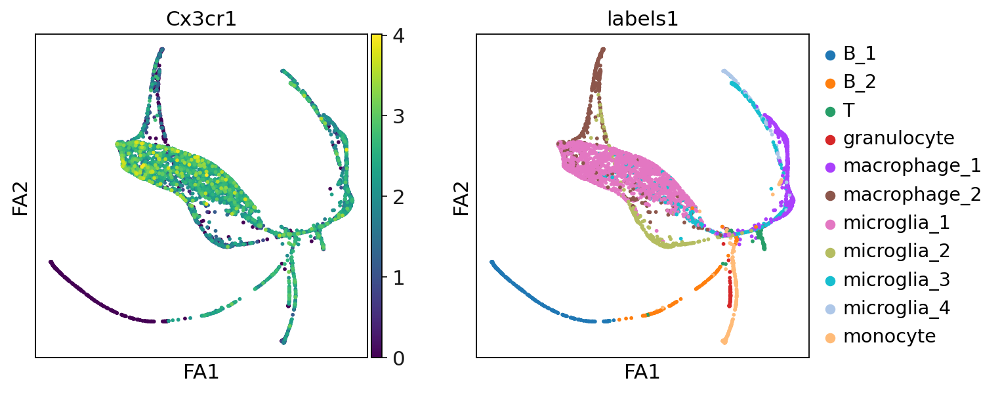

In [102]:
sc.set_figure_params()
sc.pl.draw_graph(adatamerged,color=['Cx3cr1', 'labels1'], layout = 'fa')

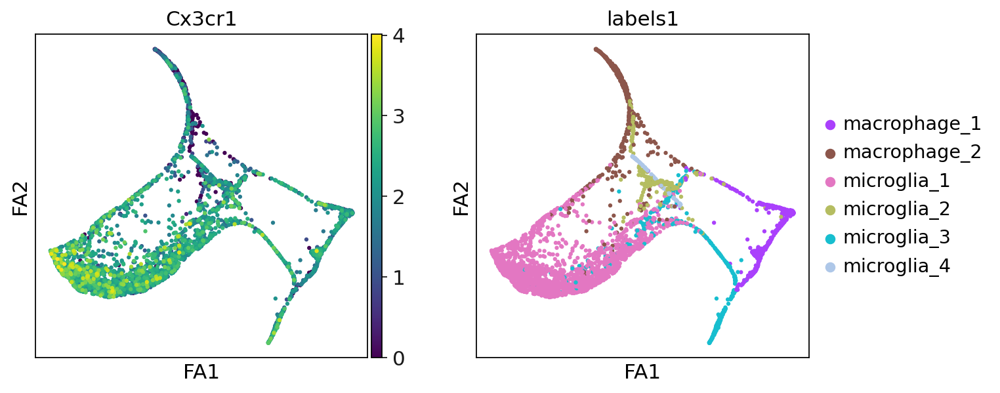

In [149]:
sc.set_figure_params()
sc.pl.draw_graph(adatamergedsubset,color=['Cx3cr1', 'labels1'], layout = 'fa')

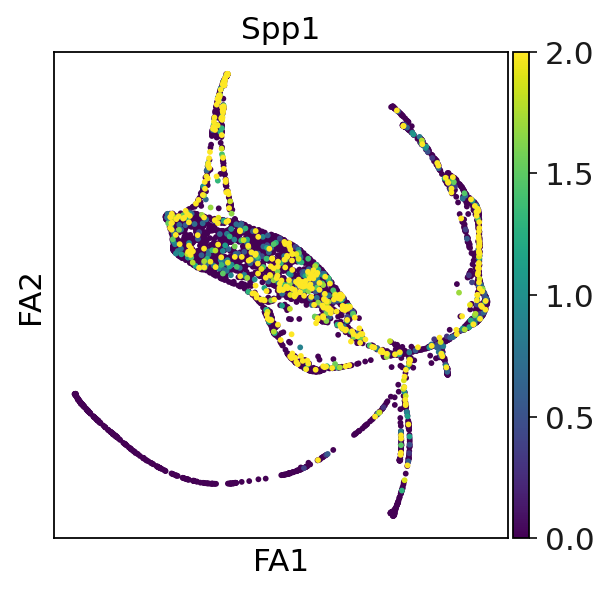

In [191]:
sc.set_figure_params()
sc.pl.draw_graph(adatamerged,color='Spp1', vmax = 2, projection = '2d', layout = 'fa', save = 'mergedSpp1.pdf')

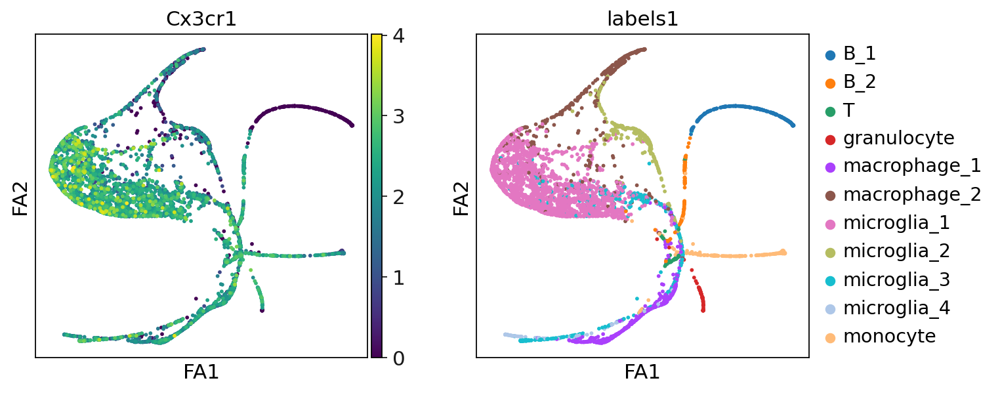

In [340]:
sc.set_figure_params()
sc.pl.draw_graph(adatamerged,color=['Cx3cr1', 'labels1'], projection = '2d', layout = 'fa')

In [1]:
sc.set_figure_params()
sc.pl.draw_graph(adatamerged,color=['Cx3cr1', 'labels1'], projection = '2d', layout = 'fa')

NameError: name 'sc' is not defined

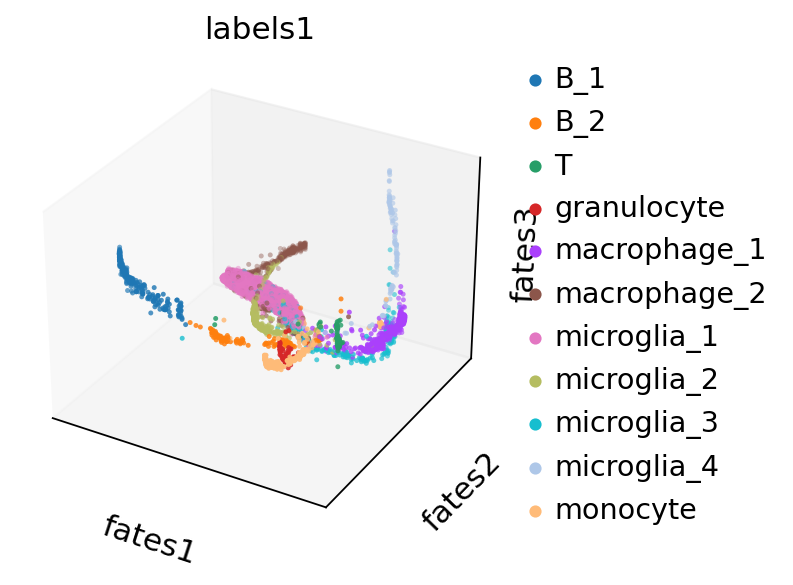

In [327]:
sc.set_figure_params()
sc.pl.embedding(adatamerged,color=['labels1'], projection = '3d', basis = 'fates')

In [231]:
color = dict(zip(range(0,16), plt.cm.tab20(range(0,16))))

In [269]:
adatamerged.obsm

AxisArrays with keys: X_pca, X_tsne, X_umap, X_palantir, X_pca2d, X_draw_graph_fa

In [306]:
draw_graph = adatamerged.obsm['X_draw_graph_fr']
draw_graph

array([[ 6.1809762 , -8.92630985],
       [ 9.23109222, -0.30469574],
       [-4.04018772, -0.23191478],
       ...,
       [-2.46771443, 10.01400819],
       [ 6.01873963, 10.37757339],
       [-5.2360922 ,  1.90810365]])

In [283]:
umap = adatamerged.obsm['X_pca']
umap

array([[ 1.5937079e+00, -6.9385904e-01,  7.2243309e-01, ...,
         2.8585117e+00,  4.3133187e-01, -1.9276023e+00],
       [ 4.8200959e-01, -8.3216448e+00,  8.5049620e+00, ...,
         3.1114283e-01,  2.0614066e+00, -4.6442381e-01],
       [-2.5719163e+00,  1.8874223e+00, -1.0288663e+00, ...,
         3.1054581e-03, -5.0054154e+00,  1.1435684e+00],
       ...,
       [-3.8113818e+00,  1.2215121e+00, -1.9259700e+00, ...,
        -6.4882666e-01,  2.5526971e-01,  1.0770285e+00],
       [-3.9606893e+00,  1.0242244e+00, -1.1199696e+00, ...,
         1.4815421e-02, -1.4717618e+00, -1.5440979e+00],
       [-2.7525234e+00,  1.2552078e+00, -2.0505710e+00, ...,
         5.6796247e-01,  9.3633302e-02,  1.2410591e+00]], dtype=float32)

In [241]:
!ls

 10X_22_055-Jaw-week6.ipynb   cache
 Untitled.ipynb		      figs
 Untitled1.ipynb	      figures
 Untitled10.ipynb	      microglia.ipynb
 Untitled2.ipynb	      retina_scfates_LRpairs.ipynb
 Untitled3.ipynb	      rstudio-2021.09.1-372-amd64.deb
 Untitled4.ipynb	      scfates-advanced.ipynb
 Untitled5.ipynb	      scfates.ipynb
 Untitled6.ipynb	      scfates_Andrei_cxcl12.ipynb
 Untitled7.ipynb	      socann
 Untitled8.ipynb	      socann.h5ad
 Untitled9.ipynb	      velocity.ipynb
 VHE-Copy1.ipynb	     'velocity2GHSOC (1).ipynb'
 VHE.ipynb		      velocityworking.ipynb
 VHE1.ipynb		      velocityworking27_12_2021_nc-Copy1.ipynb
 anaconda3		      velocityworking27_12_2021_nc.ipynb
 apps			      velocyto.py


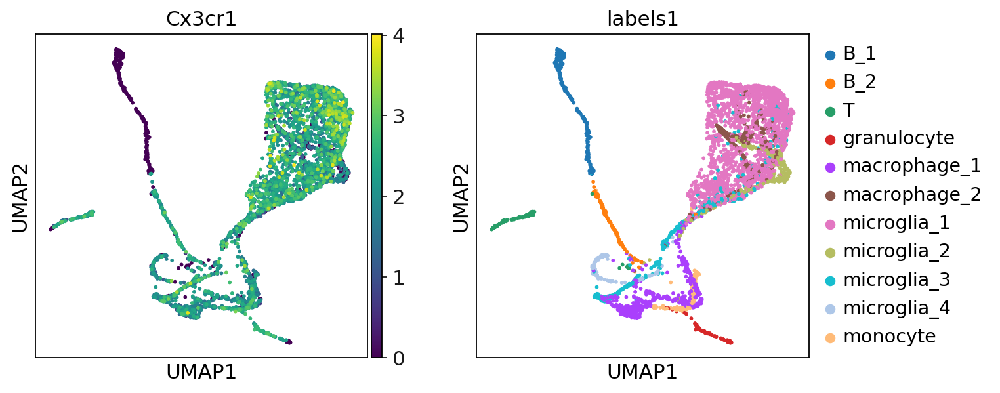

In [233]:
sc.pl.umap(adatamerged,color=['Cx3cr1', 'labels1'])

In [ ]:
!convert -delay 5 figs/*.png umap.gif

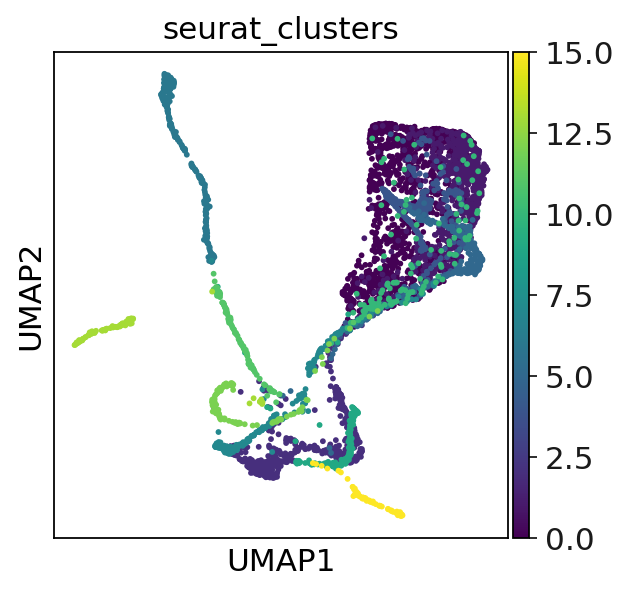

In [235]:
sc.pl.umap(adatamerged, color = ['seurat_clusters'])

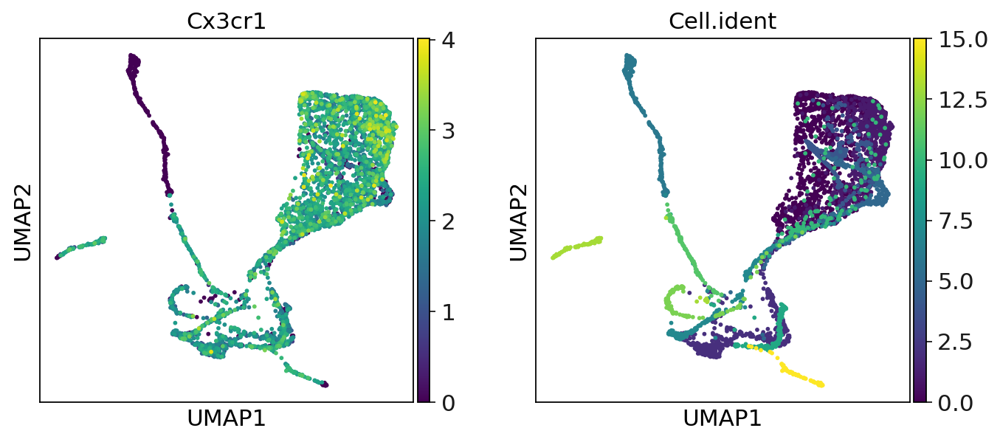

In [223]:
sc.pl.umap(adatamerged,color=['Cx3cr1', 'Cell.ident'])

In [96]:
adatamerged = AnnData.concatenate(adata1,adata2,adata3)

In [97]:
adatamerged.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels,labels1,batch
AAACCTGTCATCGCTC-1_1-0,2,11665.0,2368,Normal,1.294471,2,2,2,1,macrophage_1,0
AAACCTGTCGCGCCAA-1_1-0,9,28251.0,4833,Normal,1.723833,9,9,9,6,monocyte,0
AAACGGGTCAGGATCT-1_1-0,0,6698.0,2007,Normal,2.448492,0,0,0,0,microglia_1,0
AAAGATGCATAGACTC-1_1-0,0,9251.0,2057,Normal,4.345476,0,0,0,0,microglia_1,0
AAAGCAACATCTACGA-1_1-0,0,14500.0,2956,Normal,3.503448,0,0,0,0,microglia_1,0
...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2-2,2,11350.0,2844,OIR_WT,2.370044,2,2,2,1,macrophage_1,2
TTTGCGCGTCTCTCGT-1_2-2,2,10238.0,2791,OIR_WT,2.100020,2,2,2,1,macrophage_1,2
TTTGCGCTCAACCAAC-1_2-2,1,9996.0,2645,OIR_WT,5.472189,1,1,1,0,microglia_1,2
TTTGGTTGTAAGAGAG-1_2-2,5,6111.0,1857,OIR_WT,4.516446,5,5,5,3,microglia_2,2


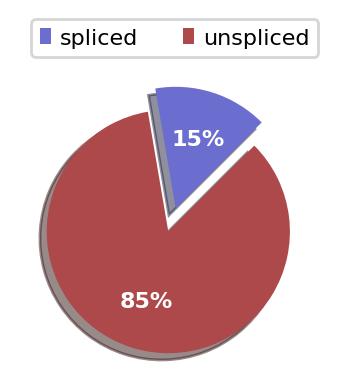

In [118]:
scv.pl.proportions(adatamergedvelo)

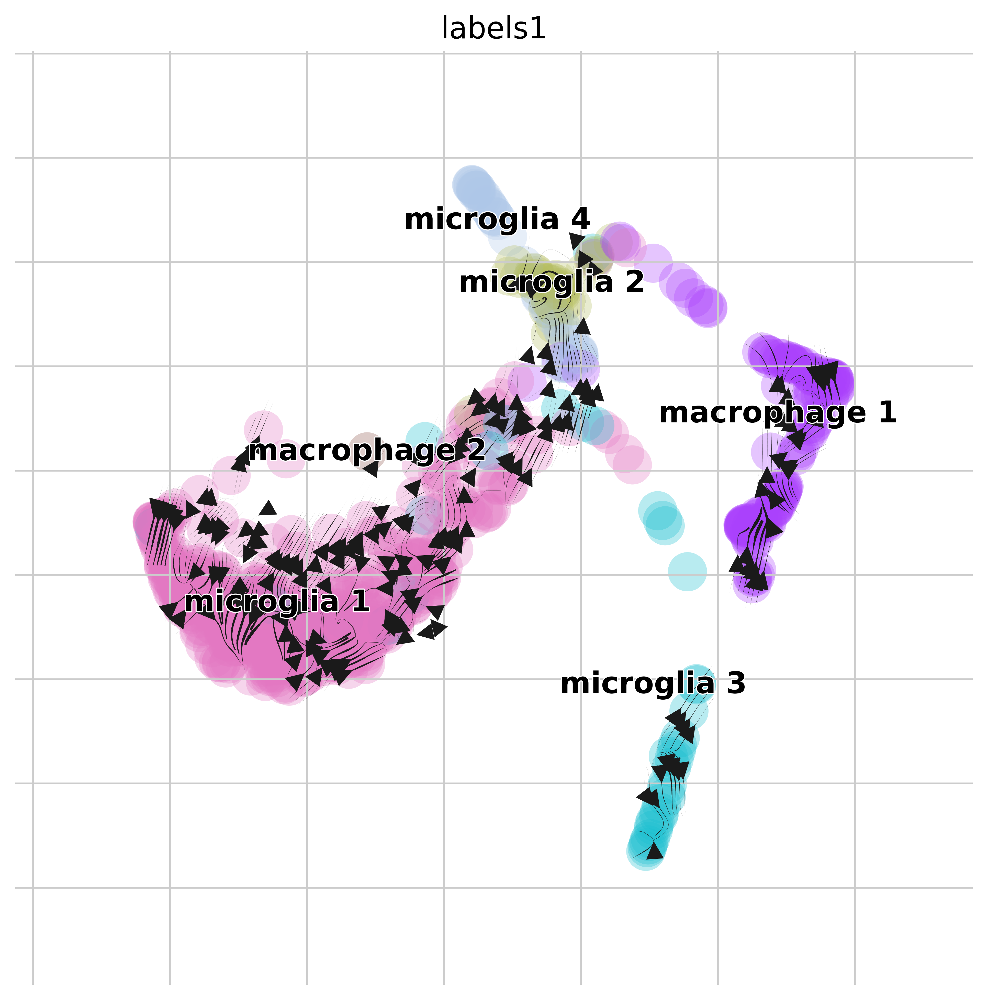

In [112]:
scv.pl.velocity_embedding_stream(adatanormalsubset, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

saving figure to file figures/microglia_WTOIRsubset_legends_lessarrows.svg


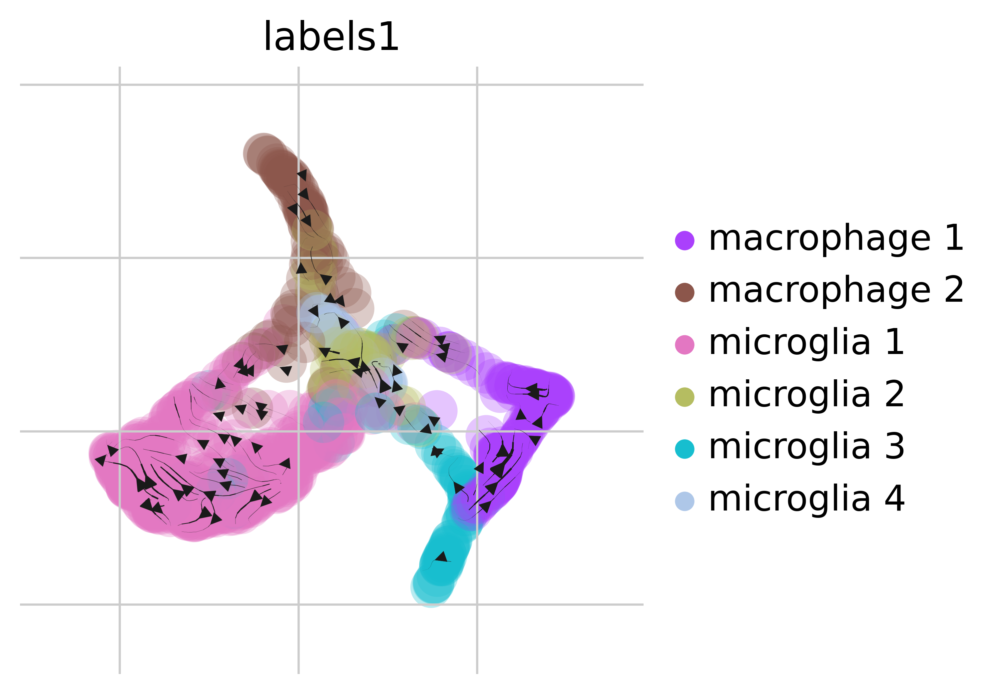

In [56]:
sc.set_figure_params(scanpy = True,format = 'svg')


scv.pl.velocity_embedding_stream(adataWTOIRsubset, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, legend_loc = 'right_margin',save="figures/microglia_WTOIRsubset_legends_lessarrows.svg")

saving figure to file figures/microglia_KOOIRsubset_legends_lessarrows.svg


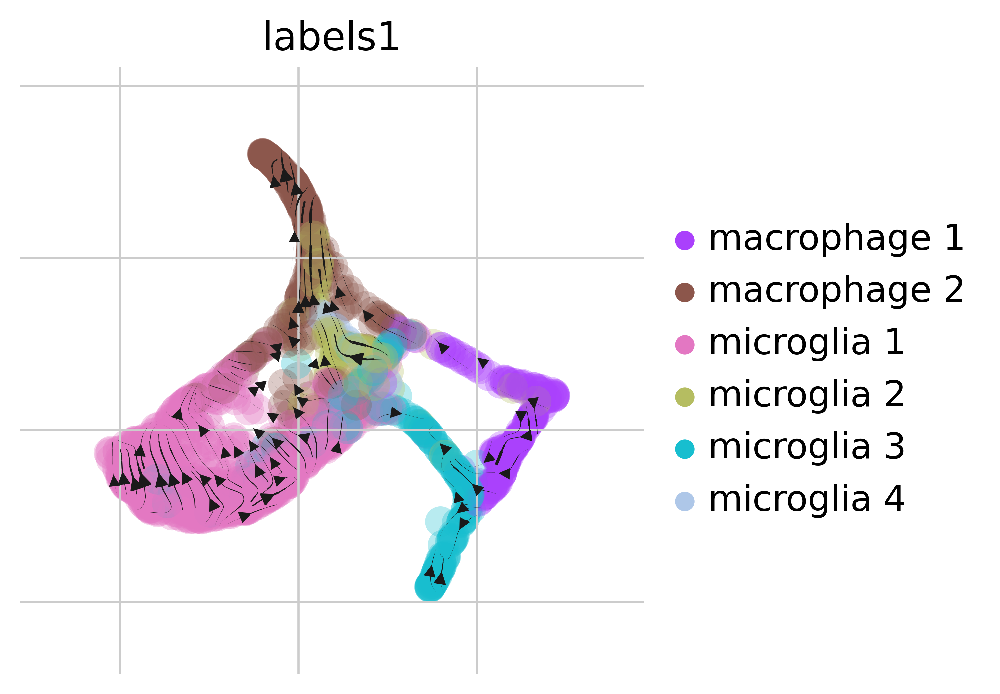

In [57]:
sc.set_figure_params(scanpy = True,format = 'svg')


scv.pl.velocity_embedding_stream(adataKOOIRsubset, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, legend_loc = 'right_margin',save="figures/microglia_KOOIRsubset_legends_lessarrows.svg")

saving figure to file figures/microglia_normalsubset_legends_lessarrows.svg


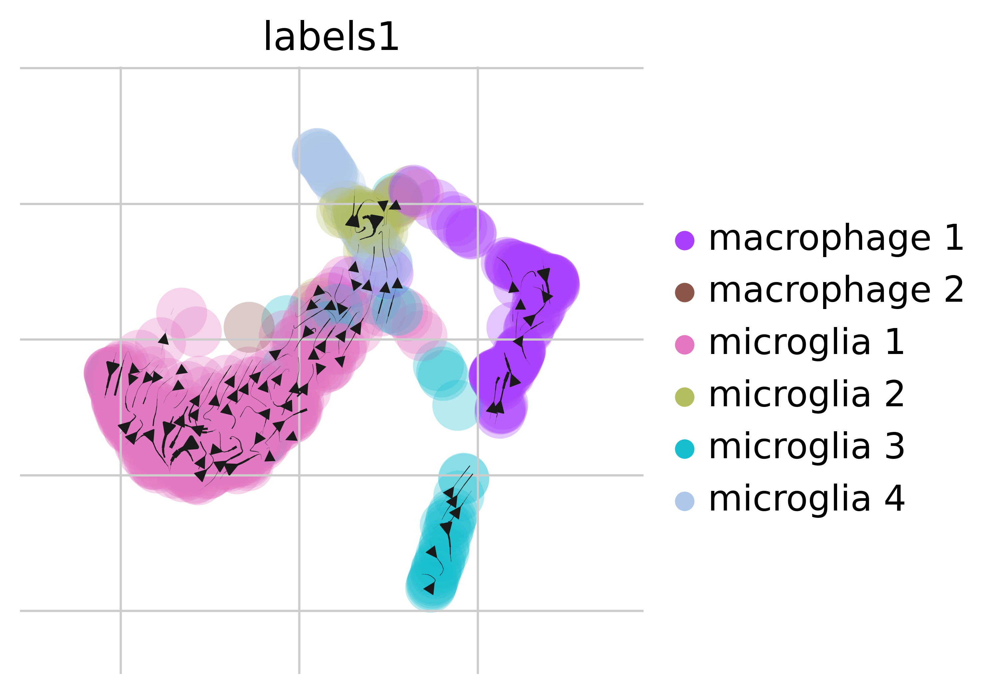

In [58]:
sc.set_figure_params(scanpy = True,format = 'svg')


scv.pl.velocity_embedding_stream(adatanormalsubset, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, legend_loc = 'right_margin',save="figures/microglia_normalsubset_legends_lessarrows.svg")

In [50]:
import scvelo as scv

saving figure to file figures/microglia_WTOIR.svg


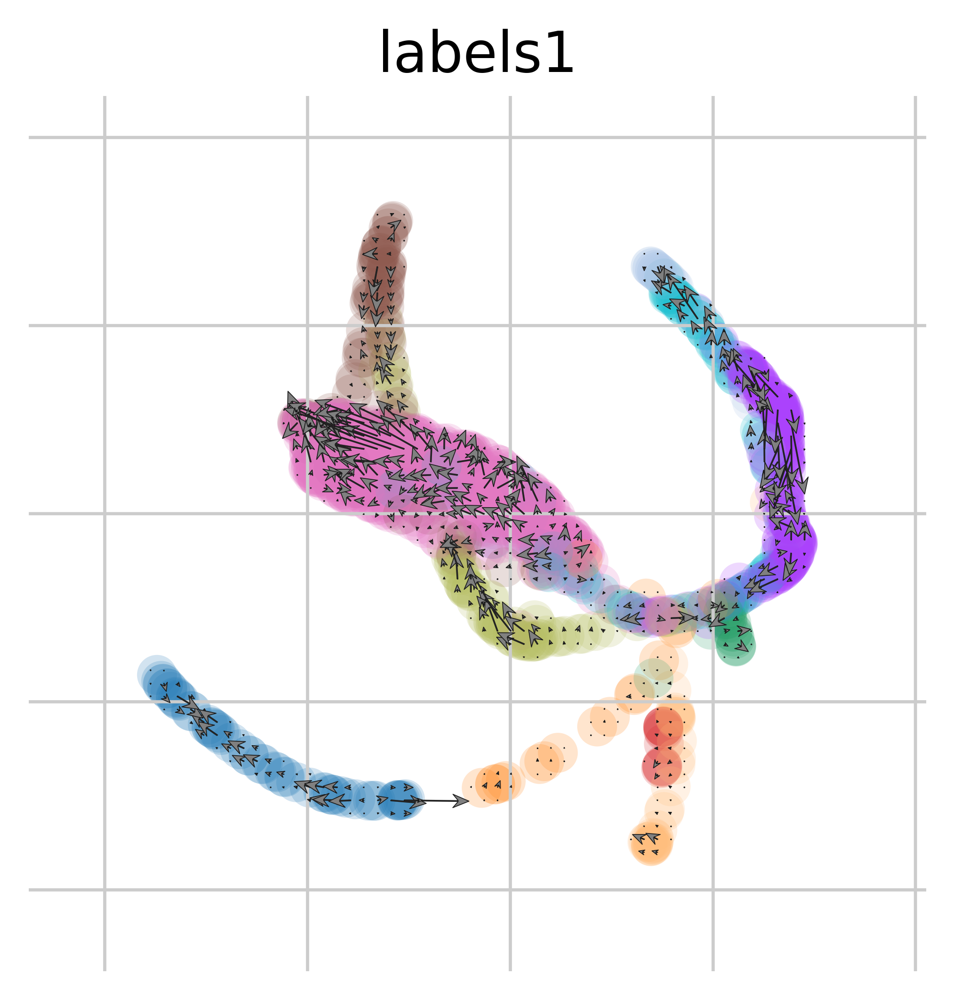

In [122]:
scv.pl.velocity_embedding_grid(adataWTOIR, basis='draw_graph_fa', arrow_length = 4, arrow_size = 3, color = 'labels1', dpi = 300, add_margin = 0.2,save="figures/microglia_WTOIR.svg")

saving figure to file figures/microglia_KOOIR.svg


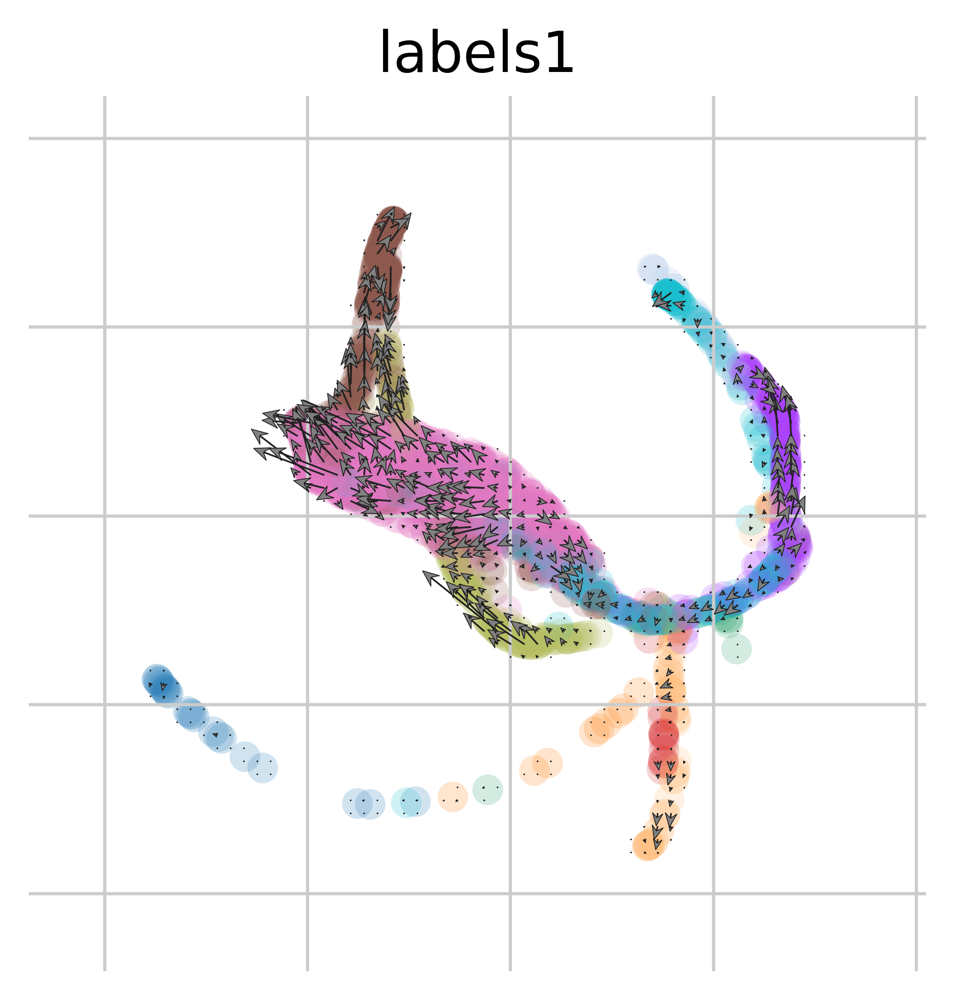

In [124]:
scv.pl.velocity_embedding_grid(adataKOOIR, basis='draw_graph_fa', arrow_length = 4, arrow_size = 3, color = 'labels1', dpi = 300, add_margin = 0.2,save="figures/microglia_KOOIR.svg")

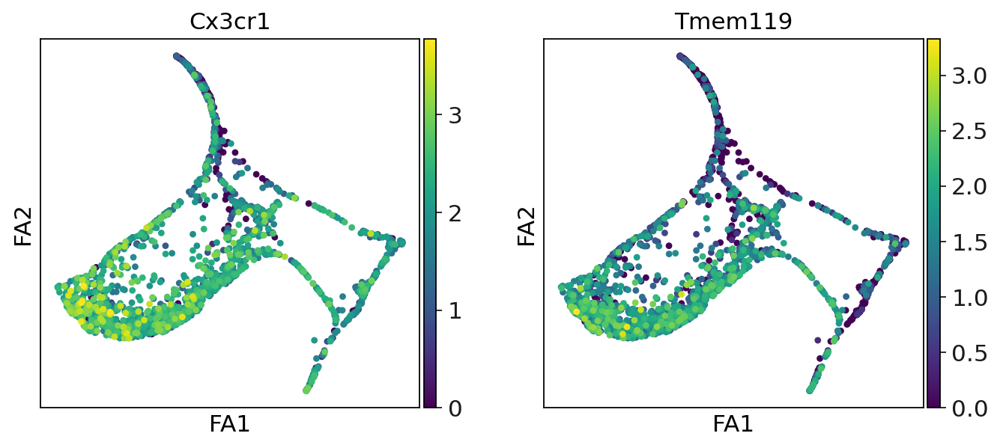

In [148]:
sc.pl.draw_graph(adataKOOIRsubset,color=["Cx3cr1",'Tmem119'],save="KOOIRcxtmem.svg")

In [156]:
adataKOOIRsubset.uns['neighbors']['distances'] = adataKOOIRsubset.obsp['distances']
adataKOOIRsubset.uns['neighbors']['connectivities'] = adataKOOIRsubset.obsp['connectivities']

In [157]:
scv.tl.paga(adataKOOIRsubset, groups='labels1')
df = scv.get_df(adataKOOIRsubset, 'paga/transitions_confidence', precision=2).T
df.style.background_gradient(cmap='Blues').format('{:.2g}')


computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:00) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


,0,1,2,3,4,5
0,0,0,0,0.084,0.4,0
1,0,0,0,0,0,0
2,0,0,0,0,0,0
3,0,0.13,0,0,0,0
4,0,0,0.81,0,0,0
5,0,0,0,0,0,0


saving figure to file figures/KOOIRsubsetpaga.pdf


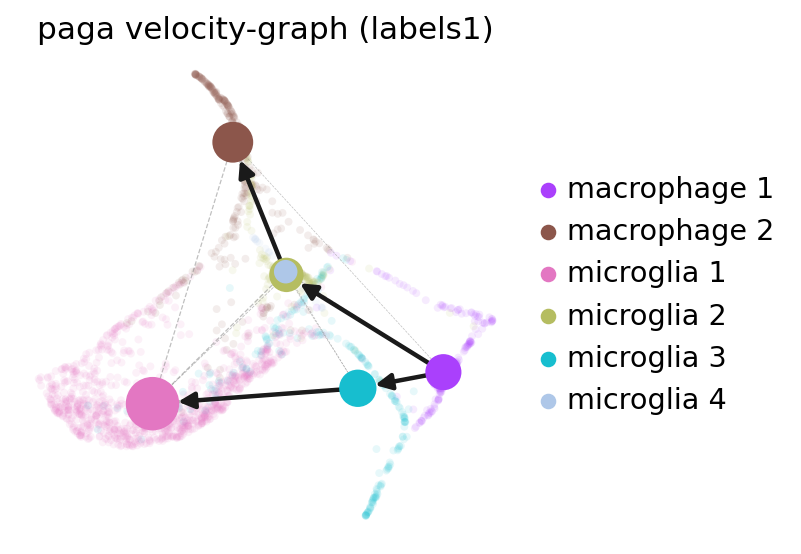

In [158]:
scv.pl.paga(adataKOOIRsubset, basis='draw_graph_fa', size=50, alpha=.1,
            min_edge_width=2, node_size_scale=1.5, save = 'figures/KOOIRsubsetpaga.pdf')

In [169]:
scv.tl.recover_dynamics(adatanormalsubset)
scv.tl.latent_time(adatanormalsubset)

recovering dynamics (using 1/12 cores)


  0%|          | 0/11 [00:00<?, ?gene/s]

    finished (0:00:02) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


saving figure to file figures/latenttimenormal.pdf


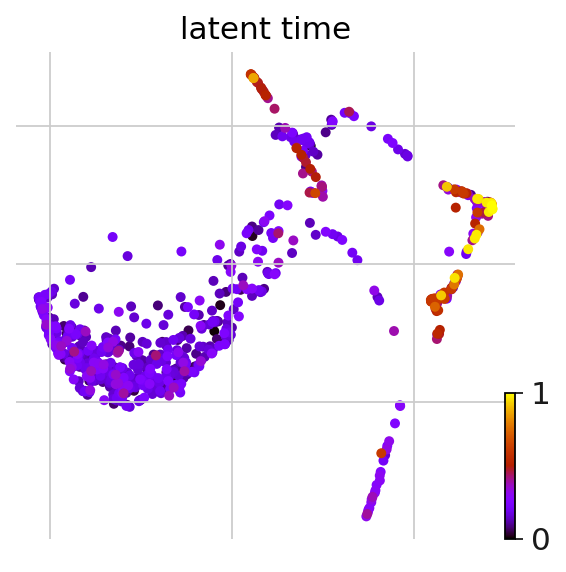

In [170]:

scv.pl.scatter(adatanormalsubset, color='latent_time', color_map='gnuplot', size=80, basis = 'draw_graph_fa', save = 'figures/latenttimenormal.pdf')

saving figure to file figures/latenttimeheatmapnormal.pdf


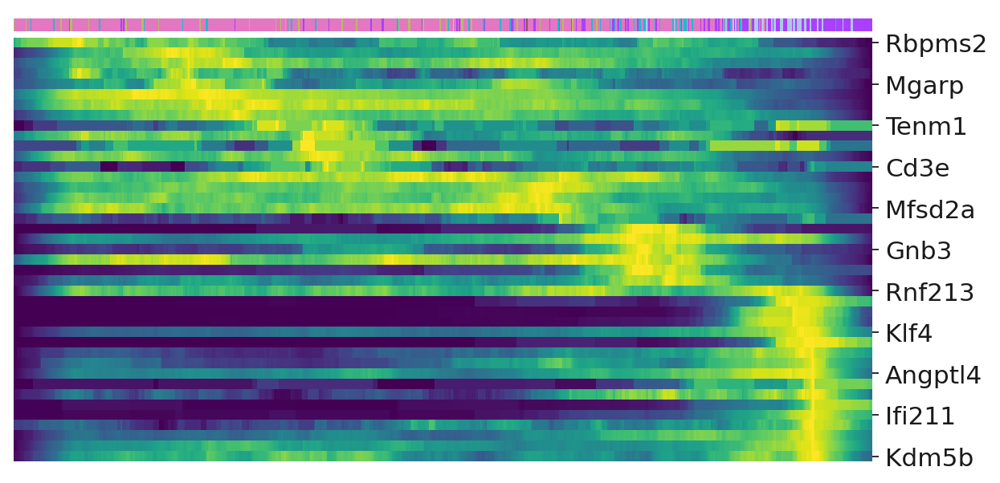

In [171]:
top_genes = adatanormalsubset.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adatanormalsubset, var_names=top_genes, sortby='latent_time', col_color='labels1', n_convolve=100, save = 'figures/latenttimeheatmapnormal.pdf')

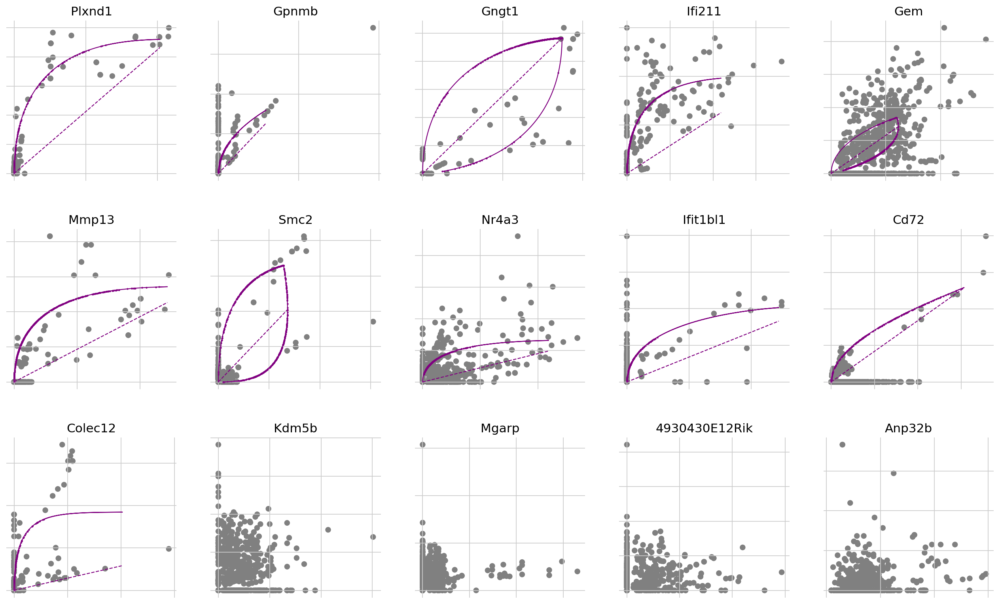

In [173]:
top_genes = adatanormalsubset.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adatanormalsubset, basis=top_genes[:15], ncols=5, frameon=False)


In [180]:
adataKOOIRsubset.var

,vst.mean,vst.variance,vst.variance.expected,vst.variance.standardized,vst.variable,Accession,Chromosome,End,Start,Strand,...,fit_std_u,fit_std_s,fit_likelihood,fit_u0,fit_s0,fit_pval_steady,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling
Kdm5b,7.13e-01,2.26e+00,1.44e+00,1.57,1,ENSMUSG00000042207.18,1,134563023,134487909,+,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Ifi211,4.82e-01,2.31e+00,8.63e-01,2.68,1,ENSMUSG00000026536.10,1,173740612,173723911,-,...,0.67,0.09,0.27,0.0,0.0,3.00e-01,1.51,0.22,0.61,2.16
Ifi203,1.92e-01,6.19e-01,2.97e-01,2.09,1,ENSMUSG00000039997.17,1,173770238,173747973,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vim,2.11e+01,2.83e+03,4.76e+02,5.93,1,ENSMUSG00000026728.10,2,13587637,13578738,+,...,0.14,0.05,0.11,0.0,0.0,3.36e-01,0.39,0.15,1.99,7.17
Mrc1,1.11e+00,1.79e+01,2.76e+00,6.50,1,ENSMUSG00000026712.4,2,14336868,14234203,+,...,1.86,0.01,0.07,0.0,0.0,1.19e-13,6.35,0.04,0.33,9.76
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ackr2,3.87e-03,9.14e-03,5.03e-03,1.82,1,ENSMUSG00000044534.9,9,121740140,121727421,+,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rab3c,1.04e-02,3.18e-02,1.51e-02,2.11,1,ENSMUSG00000021700.11,13,110417530,110190721,-,...,1.17,0.02,0.17,0.0,0.0,2.56e-03,2.88,0.05,1.18,8.18
Faim2,2.15e-02,1.16e-01,3.35e-02,2.95,1,ENSMUSG00000023011.9,15,99426046,99394893,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Grik1,1.58e-02,1.21e-01,2.42e-02,4.11,1,ENSMUSG00000022935.17,16,88087153,87692788,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
adata1 = sc.read_h5ad(r"/mnt/c/Users/Emil/10X/scretina/sunyenorm.h5ad")

In [75]:
adata2 = sc.read_h5ad(r"/mnt/c/Users/Emil/10X/scretina/sunyeOIRKO.h5ad")

In [76]:
adata3 = sc.read_h5ad(r"/mnt/c/Users/Emil/10X/scretina/sunyeOIRWT.h5ad")

In [79]:
adata1

AnnData object with n_obs × n_vars = 1178 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

In [94]:
adata1.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels
AAACCTGTCATCGCTC-1_1,2,11665.0,2368,Normal,1.29,2,2,2,NaN
AAACCTGTCGCGCCAA-1_1,9,28251.0,4833,Normal,1.72,9,9,9,NaN
AAACGGGTCAGGATCT-1_1,0,6698.0,2007,Normal,2.45,0,0,0,NaN
AAAGATGCATAGACTC-1_1,0,9251.0,2057,Normal,4.35,0,0,0,NaN
AAAGCAACATCTACGA-1_1,0,14500.0,2956,Normal,3.50,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...
TTTGGTTCACCGCTAG-1_1,9,6089.0,1998,Normal,1.81,9,9,9,NaN
TTTGGTTTCGCAAGCC-1_1,0,13402.0,2759,Normal,2.34,0,0,0,NaN
TTTGTCAAGGCGTACA-1_1,1,13586.0,3066,Normal,2.71,1,1,1,NaN
TTTGTCACAAACGCGA-1_1,5,6593.0,1634,Normal,4.08,5,5,5,NaN


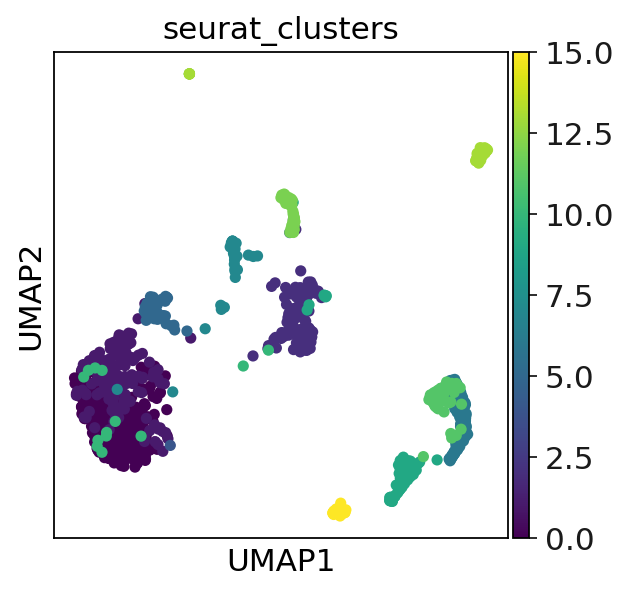

In [81]:
sc.pl.umap(adata1,color=['seurat_clusters'])

In [77]:
sunyenormal_obs = pd.read_csv(r"//mnt//c//Users//Emil//10X//scretina//sunyenormal_metadata.csv")

In [78]:
sunyeOIRKO_obs = pd.read_csv(r"//mnt//c//Users//Emil//10X//scretina//sunyeOIRKO_metadata.csv")

In [79]:
sunyeOIRWT_obs = pd.read_csv(r"//mnt//c//Users//Emil//10X//scretina//sunyeOIRWT_metadata.csv")

In [80]:
sunyenormal_obs

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels
0,AAACCTGTCATCGCTC-1_1,2_Macrophages?,11665,2368,Normal,1.294471,2,2,2_Macrophages?,macrophage_1
1,AAACCTGTCGCGCCAA-1_1,9_Microglia?,28251,4833,Normal,1.723833,9,9,9_Microglia?,monocyte
2,AAACGGGTCAGGATCT-1_1,0_Microglia?,6698,2007,Normal,2.448492,0,0,0_Microglia?,microglia_1
3,AAAGATGCATAGACTC-1_1,0_Microglia?,9251,2057,Normal,4.345476,0,0,0_Microglia?,microglia_1
4,AAAGCAACATCTACGA-1_1,0_Microglia?,14500,2956,Normal,3.503448,0,0,0_Microglia?,microglia_1
...,...,...,...,...,...,...,...,...,...,...
1173,TTTGGTTCACCGCTAG-1_1,9_Microglia?,6089,1998,Normal,1.806536,9,9,9_Microglia?,monocyte
1174,TTTGGTTTCGCAAGCC-1_1,0_Microglia?,13402,2759,Normal,2.342934,0,0,0_Microglia?,microglia_1
1175,TTTGTCAAGGCGTACA-1_1,1_Microglia?,13586,3066,Normal,2.708671,1,1,1_Microglia?,microglia_1
1176,TTTGTCACAAACGCGA-1_1,5_Microglia?,6593,1634,Normal,4.080085,5,5,5_Microglia?,microglia_2


In [92]:
sunyeOIRWT_obs = sunyeOIRWT_obs.rename(columns = {'Unnamed: 0':'CellID'})

In [93]:
sunyeOIRWT_obs = sunyeOIRWT_obs.set_index('CellID')

In [88]:
sunyeOIRKO_obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels
CellID,,,,,,,,,
AAACCTGGTACTTAGC-1,7_Microglia?,13903,3560,OIR_KO,2.610947,7,7,7_Microglia?,microglia_3
AAACCTGGTTCCATGA-1,0_Microglia?,12157,2790,OIR_KO,2.459488,0,0,0_Microglia?,microglia_1
AAACCTGTCACCCTCA-1,7_Microglia?,13481,3031,OIR_KO,3.063571,7,7,7_Microglia?,microglia_3
AAACCTGTCGCACTCT-1,0_Microglia?,5519,2084,OIR_KO,0.634173,0,0,0_Microglia?,microglia_1
AAACGGGCACGCGAAA-1,4_Microglia?,16482,2622,OIR_KO,2.414755,4,4,4_Microglia?,macrophage_2
...,...,...,...,...,...,...,...,...,...
TTTGTCAGTACAGTGG-1,0_Microglia?,6732,2505,OIR_KO,1.054664,0,0,0_Microglia?,microglia_1
TTTGTCAGTACCGGCT-1,0_Microglia?,4872,2169,OIR_KO,0.636289,0,0,0_Microglia?,microglia_1
TTTGTCAGTGTAATGA-1,4_Microglia?,2571,952,OIR_KO,2.139245,4,4,4_Microglia?,macrophage_2


In [94]:
adata3.obs['labels1'] = sunyeOIRWT_obs['labels']

In [84]:
sunyenormal_obs['labels']

CellID
AAACCTGTCATCGCTC-1_1    macrophage_1
AAACCTGTCGCGCCAA-1_1        monocyte
AAACGGGTCAGGATCT-1_1     microglia_1
AAAGATGCATAGACTC-1_1     microglia_1
AAAGCAACATCTACGA-1_1     microglia_1
                            ...     
TTTGGTTCACCGCTAG-1_1        monocyte
TTTGGTTTCGCAAGCC-1_1     microglia_1
TTTGTCAAGGCGTACA-1_1     microglia_1
TTTGTCACAAACGCGA-1_1     microglia_2
TTTGTCACAATGGAGC-1_1             B_1
Name: labels, Length: 1178, dtype: object

In [95]:
adata3.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels,labels1
AAACCTGAGTGGTAGC-1_2,1,8432.0,2376,OIR_WT,4.518501,1,1,1,0,microglia_1
AAACCTGGTACCGGCT-1_2,7,20050.0,3772,OIR_WT,3.187032,7,7,7,5,microglia_3
AAACCTGTCTGATTCT-1_2,12,14892.0,3251,OIR_WT,3.169487,12,12,12,8,microglia_4
AAACGGGAGTGGTCCC-1_2,7,10743.0,2736,OIR_WT,2.159546,7,7,7,5,microglia_3
AAACGGGTCCCTAACC-1_2,4,8493.0,2714,OIR_WT,0.423878,4,4,4,2,macrophage_2
...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2,2,11350.0,2844,OIR_WT,2.370044,2,2,2,1,macrophage_1
TTTGCGCGTCTCTCGT-1_2,2,10238.0,2791,OIR_WT,2.100020,2,2,2,1,macrophage_1
TTTGCGCTCAACCAAC-1_2,1,9996.0,2645,OIR_WT,5.472189,1,1,1,0,microglia_1
TTTGGTTGTAAGAGAG-1_2,5,6111.0,1857,OIR_WT,4.516446,5,5,5,3,microglia_2


In [28]:
import scvelo as scv

In [109]:
WTOIR = scv.read("/mnt/c/Users/Emil/10X/sunye/WTOIR/dataset1.loom", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-sunye-WTOIR-dataset1.h5ad


In [110]:
KOOIR = scv.read("/mnt/c/Users/Emil/10X/sunye/KOOIR/dataset1.loom", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-sunye-KOOIR-dataset1.h5ad


In [111]:
normal = scv.read("/mnt/c/Users/Emil/10X/sunye/normal/dataset1.loom", cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-sunye-normal-dataset1.h5ad


In [37]:
adatamerged.obs

,orig.ident,nCount_RNA,nFeature_RNA,group,percent.mt,RNA_snn_res.0.5,seurat_clusters,Cell.ident,labels,labels1,batch
AAACCTGTCATCGCTC-1_1-0,2,11665.0,2368,Normal,1.294471,2,2,2,1,macrophage_1,0
AAACCTGTCGCGCCAA-1_1-0,9,28251.0,4833,Normal,1.723833,9,9,9,6,monocyte,0
AAACGGGTCAGGATCT-1_1-0,0,6698.0,2007,Normal,2.448492,0,0,0,0,microglia_1,0
AAAGATGCATAGACTC-1_1-0,0,9251.0,2057,Normal,4.345476,0,0,0,0,microglia_1,0
AAAGCAACATCTACGA-1_1-0,0,14500.0,2956,Normal,3.503448,0,0,0,0,microglia_1,0
...,...,...,...,...,...,...,...,...,...,...,...
TTTGCGCCAGACGCTC-1_2-2,2,11350.0,2844,OIR_WT,2.370044,2,2,2,1,macrophage_1,2
TTTGCGCGTCTCTCGT-1_2-2,2,10238.0,2791,OIR_WT,2.100020,2,2,2,1,macrophage_1,2
TTTGCGCTCAACCAAC-1_2-2,1,9996.0,2645,OIR_WT,5.472189,1,1,1,0,microglia_1,2
TTTGGTTGTAAGAGAG-1_2-2,5,6111.0,1857,OIR_WT,4.516446,5,5,5,3,microglia_2,2


In [195]:
adataWTOIRsubsettest = adatamergedsubset[adatamergedsubset.obs['group'].isin(['OIR_WT'])]

In [153]:
adataKOOIRsubset = adatamergedsubset[adatamergedsubset.obs['group'].isin(['OIR_KO'])]

In [150]:
adatanormalsubset = adatamergedsubset[adatamergedsubset.obs['group'].isin(['Normal'])]

In [156]:
adataWTOIRsubset

AnnData object with n_obs × n_vars = 1079 × 1939
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels', 'labels1', 'batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'pca', 'neighbors', 'draw_graph', 'labels1_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [40]:
adataWTOIR = scv.utils.merge(adataWTOIR, WTOIR)

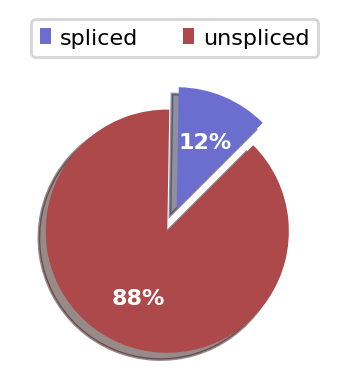

In [41]:
scv.pl.proportions(adataWTOIR)

In [155]:
adataWTOIRsubset = scv.utils.merge(adataWTOIRsubset, WTOIR)

In [157]:
adataKOOIRsubset = scv.utils.merge(adataKOOIRsubset, KOOIR)

In [108]:
adatanormal

View of AnnData object with n_obs × n_vars = 1178 × 2000
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels', 'labels1', 'batch'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'pca', 'neighbors', 'draw_graph', 'labels1_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [158]:
adatanormalsubset = scv.utils.merge(adatanormalsubset, normal)

In [59]:
WTOIR = scv.utils.merge(WTOIR, KOOIR, normal)

In [136]:
adatamergedvelo = adataWTOIRsubset.concatenate(adataKOOIRsubset,adatanormalsubset)

In [181]:
adatamerged = adataWTOIR.concatenate(adataKOOIR,adatanormal)

In [135]:
adatamergedvelo

AnnData object with n_obs × n_vars = 5 × 48
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels', 'labels1', 'batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'draw_graph', 'labels1_colors', 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_draw_graph_fa', 'X_palantir', 'X_pca', 'X_pca2d', 'X_tsne', 'X_umap', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'

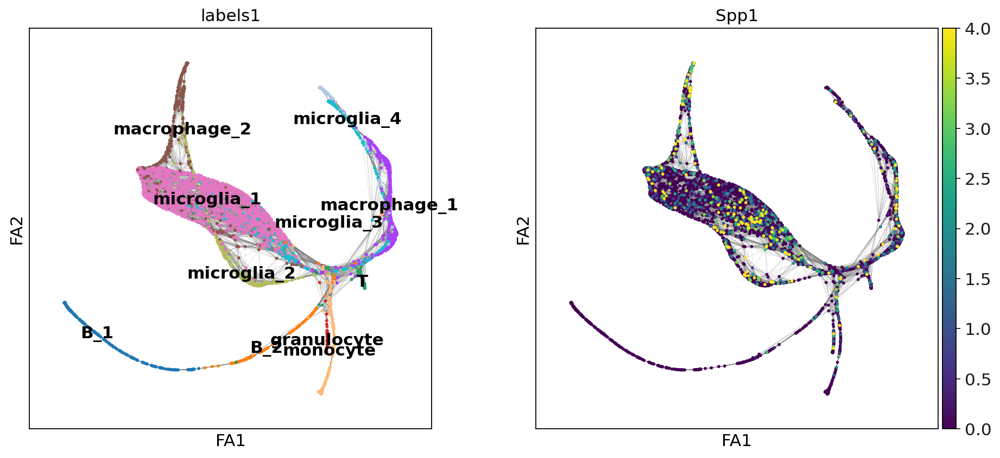

In [287]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatamerged,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data', edges = True)

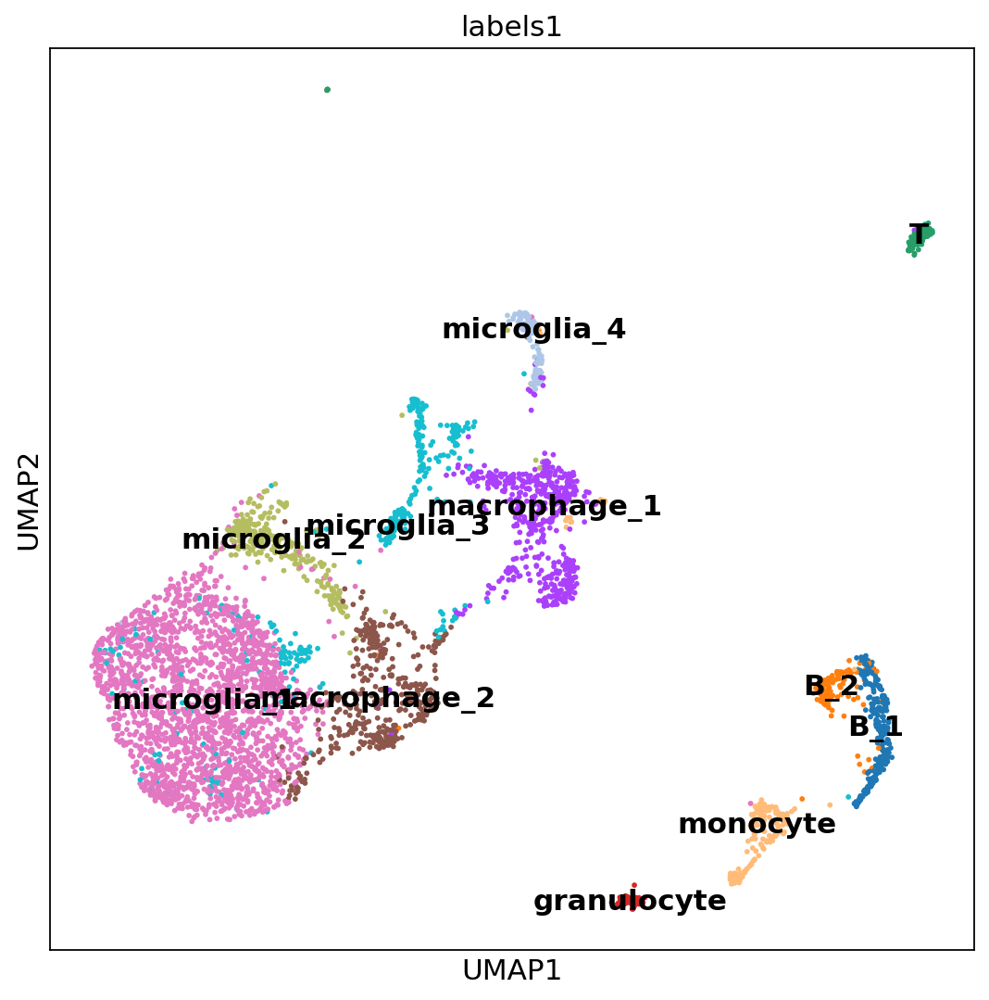

In [209]:
sc.set_figure_params(figsize = [8,8])
sc.pl.umap(adatamerged,color='labels1',
                 legend_loc = 'on data')

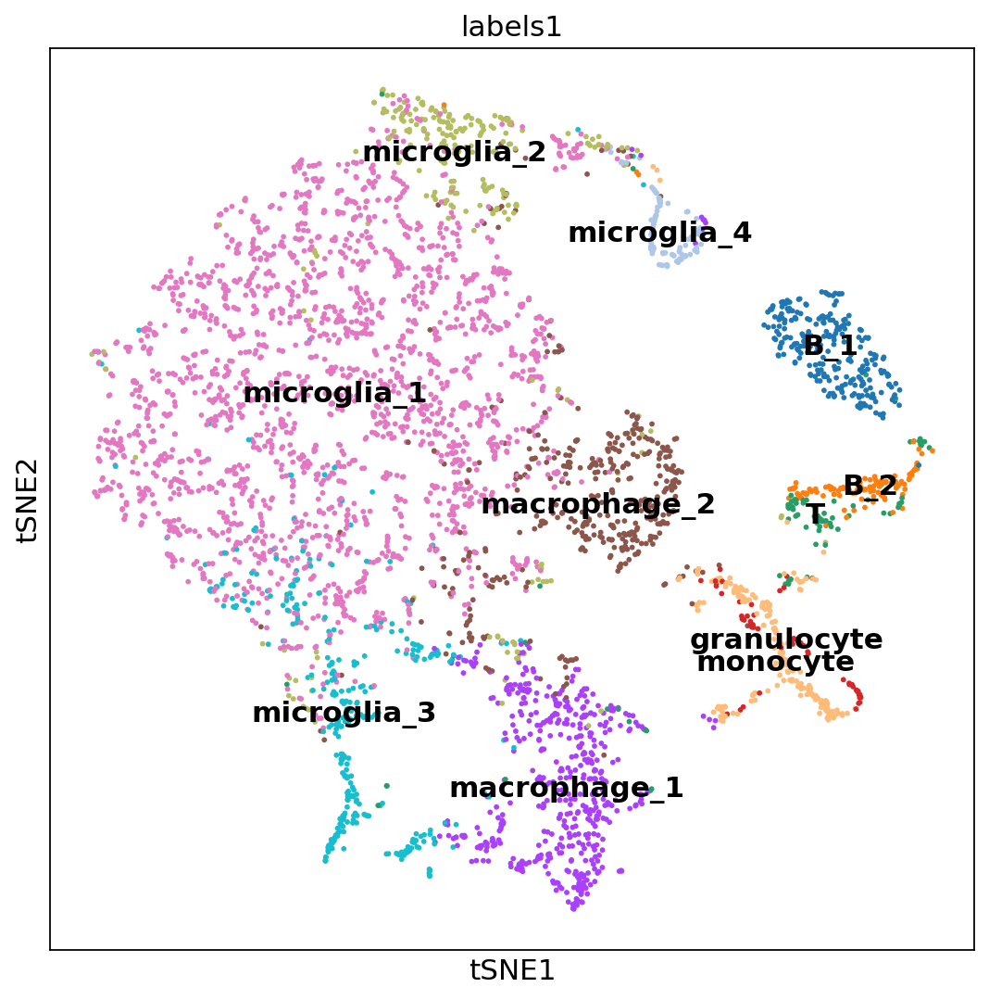

In [210]:
sc.set_figure_params(figsize = [8,8])
sc.pl.tsne(adatamerged,color='labels1',
                 legend_loc = 'on data')

In [288]:
from adjustText import adjust_text

In [291]:
adatamerged.obsm

AxisArrays with keys: X_pca, X_tsne, X_umap, X_palantir, X_pca2d, X_draw_graph_fa

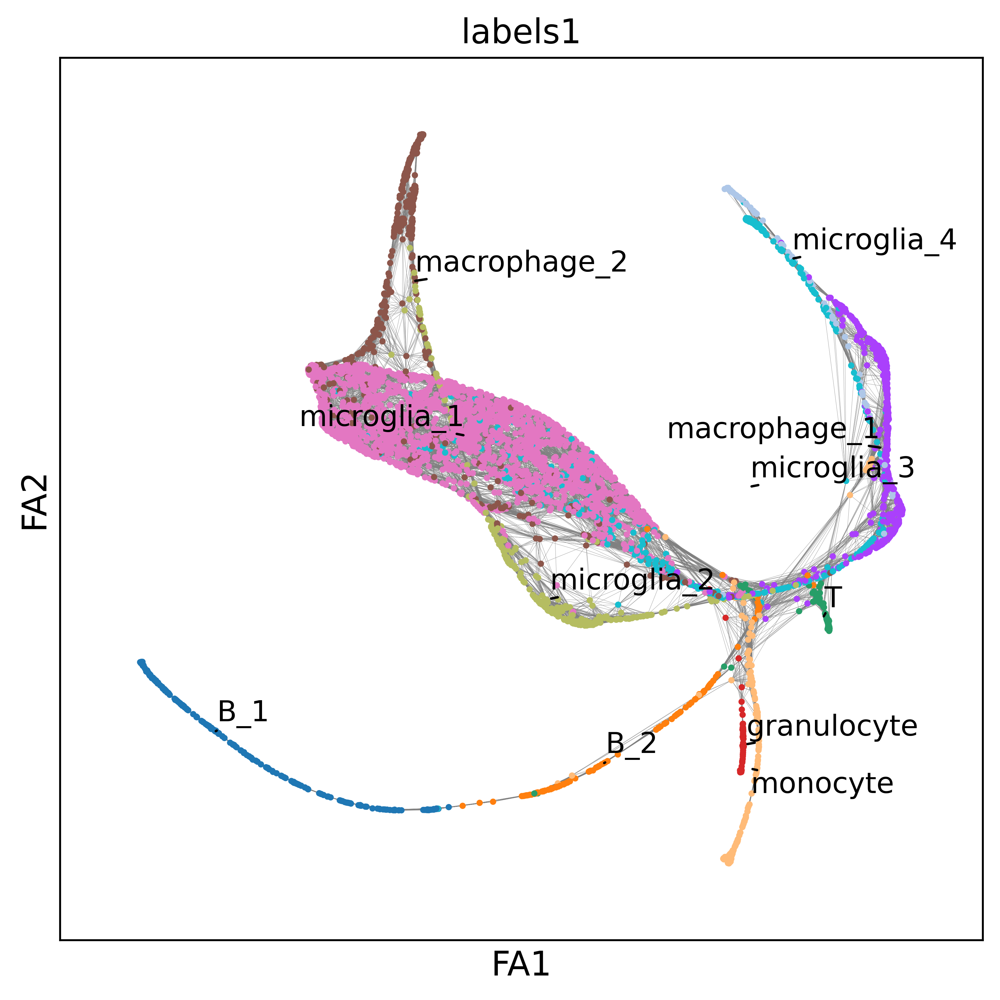

In [301]:
def gen_mpl_labels(
    adata, groupby, exclude=(), ax=None, adjust_kwargs=None, text_kwargs=None
):
    if adjust_kwargs is None:
        adjust_kwargs = {"text_from_points": False}
    if text_kwargs is None:
        text_kwargs = {}

    medians = {}

    for g, g_idx in adata.obs.groupby(groupby).groups.items():
        if g in exclude:
            continue
        medians[g] = np.median(adata[g_idx].obsm["X_draw_graph_fa"], axis=0)

    if ax is None:
        texts = [
            plt.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()
        ]
    else:
        texts = [ax.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()]

    adjust_text(texts, **adjust_kwargs)

with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": 300, "figure.frameon": False}):
    ax = sc.pl.draw_graph(adatamerged,color='labels1', show=False,edges =  True, legend_loc='None', frameon=True)
    gen_mpl_labels(
        adatamerged,
        "labels1",
        exclude=("None",),  # This was before we had the `nan` behaviour
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=12),
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.show()

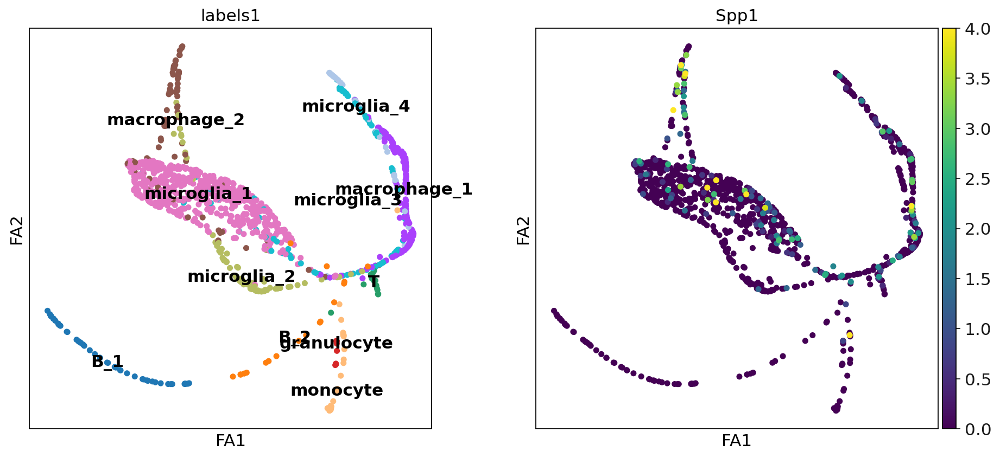

In [214]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataWTOIR,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

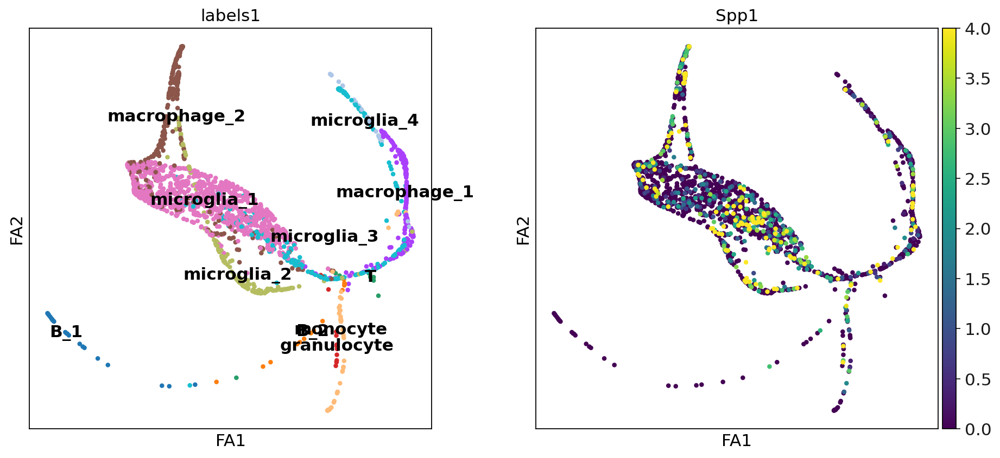

In [215]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataKOOIR,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

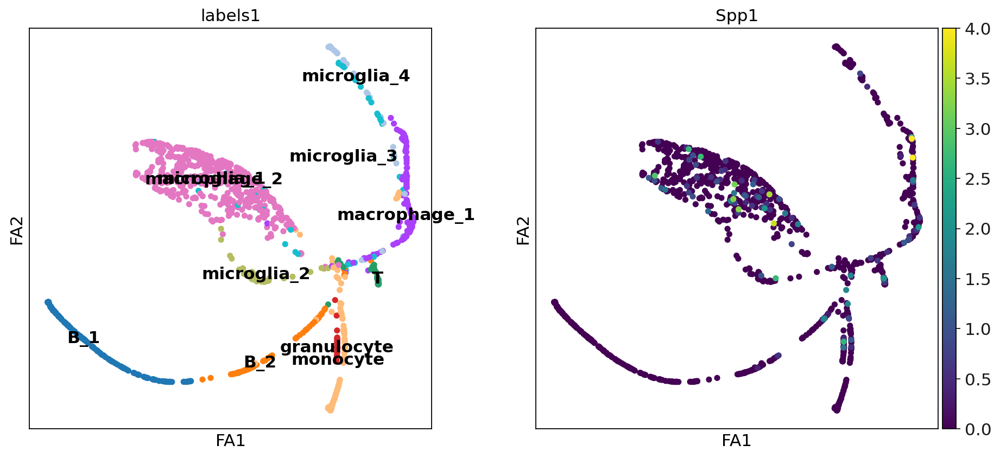

In [216]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatanormal,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

In [143]:
adatamergedsubset = adatamerged[adatamerged.obs['labels1'].isin(['macrophage_2','microglia_1','microglia_4','macrophage_1','microglia_3','microglia_2'])]

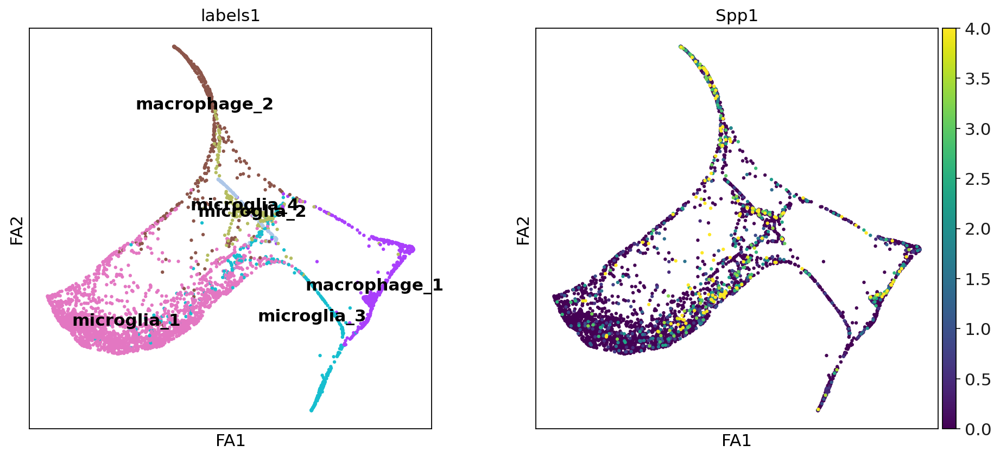

In [213]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatamergedsubset,color=['labels1','Spp1'], vmax = 4, legend_loc = 'on data')

In [48]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatamergedsubset,color=['labels1','Spp1'], vmax = 4, legend_loc = 'on data')

NameError: name 'adatamergedsubset' is not defined

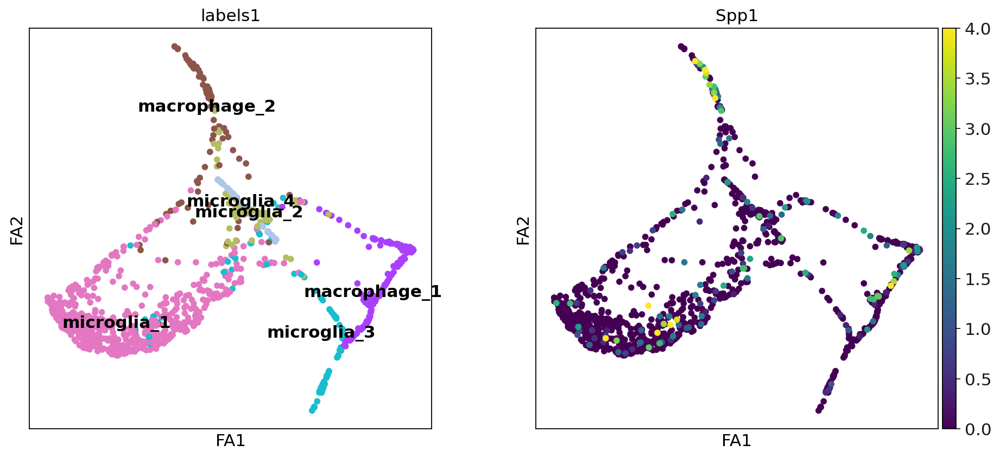

In [217]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataWTOIRsubset,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

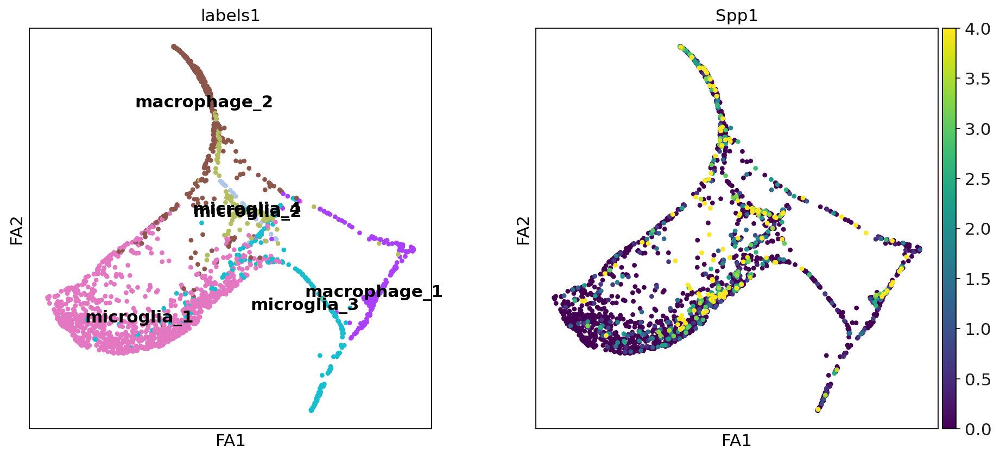

In [218]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adataKOOIRsubset,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

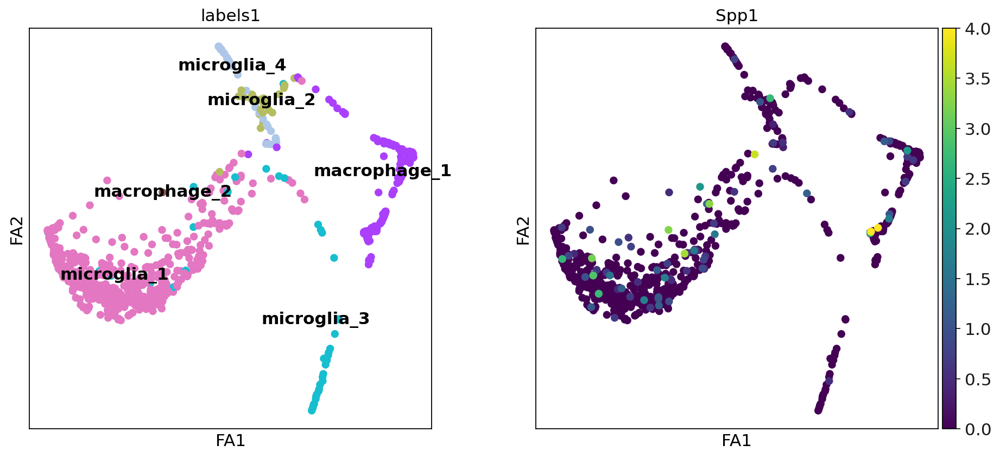

In [219]:
sc.set_figure_params(figsize = [6,6])
sc.pl.draw_graph(adatanormalsubset,color=['labels1','Spp1'],vmax = 4,
                 legend_loc = 'on data')

In [177]:
AnnData.write_h5ad(adatanormal, "/mnt/c/Users/Emil/10X/sunye/adatanormal.h5ad")

In [178]:
AnnData.write_h5ad(adatanormalsubset, "/mnt/c/Users/Emil/10X/sunye/adatanormalsubset.h5ad")

In [179]:
AnnData.write_h5ad(adataWTOIR, "/mnt/c/Users/Emil/10X/sunye/adataWTOIR.h5ad")

In [196]:
AnnData.write_h5ad(adataWTOIRsubsettest, "/mnt/c/Users/Emil/10X/sunye/adataWTOIRsubsettest.h5ad")

In [181]:
AnnData.write_h5ad(adataKOOIR, "/mnt/c/Users/Emil/10X/sunye/adataKOOIR.h5ad")

In [53]:
adatanormal = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adatanormal1.h5ad")
adatanormalsubset = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adatanormalsubset.h5ad")
adataWTOIR = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adataWTOIR.h5ad")
adataWTOIRsubset = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adataWTOIRsubset.h5ad")
adataKOOIR = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adataKOOIR.h5ad")
adataKOOIRsubset = sc.read_h5ad("/mnt/c/Users/Emil/10X/sunye/adataKOOIRsubset.h5ad")

In [107]:
adatanormal

AnnData object with n_obs × n_vars = 1178 × 57
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels', 'labels1', 'batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'draw_graph', 'labels1_colors', 'neighbors', 'pca', 'velocity_graph', 'velocity_graph_neg', 'velocity_params'
    obsm: 'X_draw_graph_fa', 'X_palantir', 'X_pca', 'X_pca2d', 'X_tsne', 'X_umap', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced', 'variance_velocity', 'velocity'
    obsp: 'connectivities', 'distances'

In [194]:
AnnData.write_csvs(adataKOOIRsubset, "/mnt/c/Users/Emil/10X/sunye/adatanormal.h5ad")

/home/mcrewcow/anaconda3/lib/python3.7/site-packages/anndata/_io/write.py:50: WriteWarning: Omitting to write sparse annotation.
  warnings.warn("Omitting to write sparse annotation.", WriteWarning)


In [192]:
adataKOOIR

AnnData object with n_obs × n_vars = 2037 × 68
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'group', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'Cell.ident', 'labels', 'labels1', 'batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_self_transition'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'pca', 'neighbors', 'draw_graph', 'labels1_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg'
    obsm: 'X_pca', 'X_tsne', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa', 'velocity_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity', 'variance_velocity'
    obsp: 'distances', 'connectivities'

computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


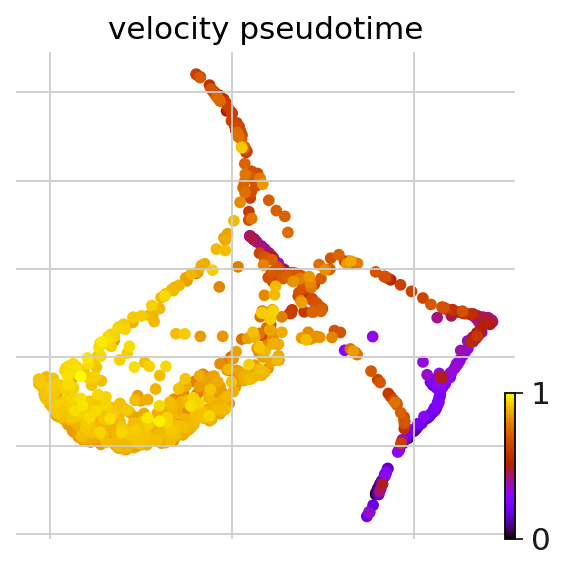

In [206]:
scv.tl.velocity_pseudotime(adataWTOIRsubset)
scv.pl.scatter(adataWTOIRsubset, color='velocity_pseudotime',basis='draw_graph_fa', cmap='gnuplot')

In [228]:
pip list


Package                 Version
----------------------- -----------
adjustText              0.7.3
aiohttp                 3.8.3
aiosignal               1.3.1
anndata                 0.8.0
anndata2pagoda          0.1
anndata2ri              1.0.6
appdirs                 1.4.4
arboreto                0.1.6
argon2-cffi             21.3.0
argon2-cffi-bindings    21.2.0
args                    0.1.0
async-timeout           4.0.2
asynctest               0.13.0
attrs                   21.4.0
backcall                0.2.0
backports.zoneinfo      0.2.1
beautifulsoup4          4.11.1
bleach                  5.0.0
bokeh                   2.4.3
boltons                 21.0.0
brotlipy                0.7.0
cached-property         1.5.2
cellrank                1.2.0
certifi                 2021.10.8
cffi                    1.15.0
charset-normalizer      2.0.4
click                   8.1.2
clint                   0.5.1
cloudpickle             2.2.1
cmake                   3.24.1
colorama              